# Stage 3-2 — Dynamic nested sampling of CASA dirty images

Stage 3-1で保存したdirty cubeを読み、bulge/no-bulge mass modelをDynamic Nested Samplingで比較。ピクセルノイズは相関しているので。evidenceと誤差幅はあくまで近似であることに注意。visibility-domain likelihoodはStage4で扱うがその前段としてテスト。


In [1]:
import os

# Each process runs one dynesty fit; prevent numerical libraries from creating nested thread pools.
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'

import multiprocessing as mp
from concurrent.futures import ThreadPoolExecutor
import hashlib
import json
import pickle
import time
import tomllib
from itertools import product
from pathlib import Path

import dynesty
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.stats import mad_std
from astropy.table import Table
from dynesty import plotting as dyplot
from cmcrameri import cm

%matplotlib inline

EXAMPLE_DIR = Path.cwd().resolve()
if not (
    EXAMPLE_DIR.name == 'examples'
    or (EXAMPLE_DIR.name == 'forward_mass' and EXAMPLE_DIR.parent.name == 'examples')
):
    raise FileNotFoundError('Run this notebook from examples/forward_mass or examples.')

from glint import lensing
from glint.context import UVContext, ImageContext, build_finufft_plans, build_uv_layout
from glint.cosmology import critical_density, kpc_per_arcsec
from glint.forward import cube_to_visibilities, convolve_cube_spatial_cached, forward_model_3D_mass_intrinsic, mass_rotation_curve
from glint.inference import run_dynamic_dynesty
from glint.interferometer import ARCSEC2RAD, vis_to_image_finufft_type3
from glint.mass_model import r200_kpc_from_m200


## Diagnostic plotting helpers

These helper functions are defined before the experiment setup and called after sampling or cache loading. Generated files are written under `output/stage3/results/`.

In [2]:
def save_dynesty_diagnostic_plots():
    # runplotはevidenceの収束過程、cornerplotはposteriorとparameter縮退を確認する。
    for case in CASES:
        for model_name in ('no_bulge', 'bulge'):
            result = RESULTS[case['name']][model_name]
            result_dir = FIGURE_DIR / case['name'] / model_name
            result_dir.mkdir(parents=True, exist_ok=True)

            run_figure, _ = dyplot.runplot(result['results'], color='tab:blue', logplot=True)
            run_figure.suptitle(f"{case['name']} — {model_name}")
            run_path = result_dir / 'dynesty_runplot.pdf'
            run_figure.savefig(run_path, bbox_inches='tight')
            plt.close(run_figure)

            parameter_names = MODEL_FREE_NAMES[model_name]
            case_truth = truth_parameters(case)
            truths = [case_truth[name] for name in parameter_names]
            corner_figure, _ = dyplot.cornerplot(
                result['results'], labels=parameter_names, truths=truths,
                truth_color='tab:red', color='black', show_titles=True,
            )
            corner_figure.suptitle(f"{case['name']} — {model_name}")
            corner_path = result_dir / 'dynesty_cornerplot.pdf'
            corner_figure.savefig(corner_path, bbox_inches='tight')
            plt.close(corner_figure)
            print(f'saved {run_path.relative_to(EXAMPLE_DIR)} and {corner_path.relative_to(EXAMPLE_DIR)}')

### Channel-map and residual helper

The channel-map helper also computes reduced $\chi^2$ and standardized-residual statistics for every case/model.

In [3]:
def flatten_selected_visibilities(array, context):
    """Flatten channel/row visibilities using the context's flag and slices."""
    output = np.empty(context.Ntot, dtype=np.asarray(array).dtype)
    for channel, output_slice in enumerate(context.slices):
        if output_slice is not None:
            output[output_slice] = np.asarray(array)[channel, ~context.flag[channel]]
    return output


def build_diagnostic_uv_context(uv, eps=1e-6):
    """Build the same direct-NUFFT sampling operator for observed and model data."""
    flag = np.asarray(uv['flag'], dtype=bool)
    k_list, slices, ntotal = build_uv_layout(
        np.asarray(uv['uvw_lam'])[0], np.asarray(uv['uvw_lam'])[1], flag,
    )
    l_rad = (XX_IMAGE_ARCSEC * ARCSEC2RAD).ravel().astype(np.float32)
    m_rad = (YY_IMAGE_ARCSEC * ARCSEC2RAD).ravel().astype(np.float32)
    plans = build_finufft_plans(k_list, l_rad, m_rad, eps=eps)
    radius = np.hypot(XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC)
    pb = np.exp(
        -4.0 * np.log(2.0)
        * radius[None]**2 / np.asarray(uv['pb_fwhm_arcsec'])[:, None, None]**2
    )
    return UVContext(
        pb=pb, plans=plans, slices=slices,
        nchan=len(VELOCITY_CHANNELS_KMS), Ntot=ntotal, flag=flag,
    )


def line_free_visibility_sigma_scale(uv, context, edge_channels):
    """Calibrate exported sigma from real/imaginary line-free visibility scatter."""
    channel_indices = tuple(range(edge_channels)) + tuple(range(context.nchan - edge_channels, context.nchan))
    normalized = []
    for channel in channel_indices:
        selected = ~context.flag[channel]
        normalized.append(np.asarray(uv['data'])[channel, selected] / np.asarray(uv['sigma'])[channel, selected])
    values = np.concatenate(normalized)
    component_scales = []
    for component in (values.real, values.imag):
        median = np.median(component)
        component_scales.append(1.482602218505602 * np.median(np.abs(component - median)))
    scale = float(np.mean(component_scales))
    if not np.isfinite(scale) or scale <= 0:
        raise ValueError('line-free visibility sigma scale must be finite and positive')
    return scale


def diagnostic_dirty_cube(flat_visibilities, uv, context, eps=1e-6):
    """Image selected visibilities with identical sampling and natural weighting."""
    cube = np.empty((context.nchan, *XX_IMAGE_ARCSEC.shape), dtype=float)
    for channel, output_slice in enumerate(context.slices):
        if output_slice is None:
            cube[channel] = np.nan
            continue
        selected = ~context.flag[channel]
        sigma = np.asarray(uv['sigma'])[channel, selected]
        weight = 1.0 / sigma**2
        cube[channel], _ = vis_to_image_finufft_type3(
            np.asarray(uv['uvw_lam'])[0, channel, selected],
            np.asarray(uv['uvw_lam'])[1, channel, selected],
            flat_visibilities[output_slice], weight,
            XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC, eps=eps,
        )
    return cube


def diagnostic_model_visibilities(parameters, mock, context):
    """Evaluate the best-fit sky directly at the observed uv coordinates."""
    image_cube = mock['flux_scale'] * lensed_cube(intrinsic_cube(parameters), parameters)
    return cube_to_visibilities(image_cube, context)


def save_channel_diagnostics():
    """Save all-channel direct-NUFFT comparisons without reading tclean images."""
    diagnostic_rows = []
    image_extent = [
        XX_IMAGE_ARCSEC.min(), XX_IMAGE_ARCSEC.max(),
        YY_IMAGE_ARCSEC.min(), YY_IMAGE_ARCSEC.max(),
    ]
    source_extent = [
        XX_SOURCE_ARCSEC.min(), XX_SOURCE_ARCSEC.max(),
        YY_SOURCE_ARCSEC.min(), YY_SOURCE_ARCSEC.max(),
    ]

    for case in CASES:
        case_name = case['name']
        mock = MOCKS[case_name]
        uv = mock['uv']
        context = build_diagnostic_uv_context(uv)
        observed_vis = flatten_selected_visibilities(uv['data'], context)
        signal_vis = flatten_selected_visibilities(mock['signal_uv']['data'], context)
        uv_sigma_scale = line_free_visibility_sigma_scale(
            uv, context, int(CONFIG['image_fit']['line_free_edge_channels']),
        )
        sigma_vis = uv_sigma_scale * flatten_selected_visibilities(uv['sigma'], context)
        observed_dirty = diagnostic_dirty_cube(observed_vis, uv, context)
        noise_dirty = diagnostic_dirty_cube(observed_vis - signal_vis, uv, context)
        noise_rms = np.asarray([mad_std(channel, ignore_nan=True) for channel in noise_dirty])
        fallback_rms = np.nanstd(noise_dirty, axis=(1, 2))
        noise_rms = np.where(
            np.isfinite(noise_rms) & (noise_rms > 0), noise_rms, fallback_rms,
        )

        for model_name in ('no_bulge', 'bulge'):
            result = RESULTS[case_name][model_name]
            best = result['best_parameters']
            source_cube = intrinsic_cube(best)
            model_vis = diagnostic_model_visibilities(best, mock, context)
            model_dirty = diagnostic_dirty_cube(model_vis, uv, context)
            residual_dirty = observed_dirty - model_dirty
            residual_sigma = residual_dirty / noise_rms[:, None, None]

            # Stage 3 sampling used the approximate CASA dirty-image likelihood.
            fit_model_cube = observed_model_cube(best, case_name)
            fitted_residual = (
                (mock['data_cube'] - fit_model_cube) / mock['noise_sigma']
            )[FIT_MASK]
            n_parameters = len(MODEL_FREE_NAMES[model_name])
            image_dof = fitted_residual.size - n_parameters
            image_chi2 = float(np.sum(fitted_residual**2))
            image_reduced_chi2 = image_chi2 / image_dof

            # This visibility chi-square is an independent diagnostic, not the sampled likelihood.
            visibility_chi2 = float(np.sum(np.abs((observed_vis - model_vis) / sigma_vis)**2))
            visibility_dof = 2 * observed_vis.size - n_parameters
            visibility_reduced_chi2 = visibility_chi2 / visibility_dof
            diagnostic_rows.append((
                case_name, model_name,
                image_chi2, image_dof, image_reduced_chi2,
                visibility_chi2, visibility_dof, visibility_reduced_chi2, uv_sigma_scale,
                float(np.mean(fitted_residual)), float(np.std(fitted_residual)),
            ))

            result_dir = FIGURE_DIR / case_name / model_name
            result_dir.mkdir(parents=True, exist_ok=True)
            n_channels = len(VELOCITY_CHANNELS_KMS)
            figure, axes = plt.subplots(
                n_channels, 4, figsize=(8.5, 1.65 * n_channels), squeeze=False,
            )
            figure.subplots_adjust(wspace=0.02, hspace=0.02, top=0.975)
            image_vmin = -2.0 * float(np.nanmedian(noise_rms))
            image_vmax = 0.9 * max(
                float(np.nanmax(observed_dirty)), float(np.nanmax(model_dirty)),
            )
            source_vmax = float(np.nanmax(source_cube))

            for channel, velocity_kms in enumerate(VELOCITY_CHANNELS_KMS):
                # The first three panels intentionally share colormap and color limits.
                panels = (
                    (observed_dirty[channel], image_vmin, image_vmax, image_extent),
                    (model_dirty[channel], image_vmin, image_vmax, image_extent),
                    (residual_dirty[channel], image_vmin, image_vmax, image_extent),
                    (source_cube[channel], 0.0, source_vmax, source_extent),
                )
                for column, (panel, vmin, vmax, extent) in enumerate(panels):
                    axes[channel, column].imshow(
                        panel, origin='lower', extent=extent,
                        cmap=cm.roma_r, vmin=vmin, vmax=vmax,
                    )
                    axes[channel, column].set_xticks([])
                    axes[channel, column].set_yticks([])

                observed_snr = observed_dirty[channel] / noise_rms[channel]
                model_snr = model_dirty[channel] / noise_rms[channel]
                for column, snr_map in ((0, observed_snr), (1, model_snr)):
                    peak = float(np.nanmax(snr_map))
                    levels = [level for level in (8.0, 16.0, 32.0) if level <= peak]
                    if levels:
                        axes[channel, column].contour(
                            snr_map, levels=levels, colors='black',
                            linewidths=0.25, alpha=0.55,
                            origin='lower', extent=image_extent,
                        )
                residual_levels = [
                    level for level in (-5.0, -4.0, -3.0, 3.0, 4.0, 5.0)
                    if np.nanmin(residual_sigma[channel]) <= level <= np.nanmax(residual_sigma[channel])
                ]
                if residual_levels:
                    axes[channel, 2].contour(
                        residual_sigma[channel], levels=residual_levels,
                        colors='black', linewidths=0.25, alpha=0.55,
                        origin='lower', extent=image_extent,
                    )
                axes[channel, 0].text(
                    0.03, 0.93,
                    f'{velocity_kms:+.0f} km/s; Peak S/N={np.nanmax(observed_snr):.1f}',
                    transform=axes[channel, 0].transAxes,
                    color='white', fontsize=7, va='top',
                )

            titles = (
                'Truth / observed dirty', 'Best-fit model dirty',
                'Residual dirty', 'Best-fit intrinsic source',
            )
            for axis_object, title in zip(axes[0], titles, strict=True):
                axis_object.set_title(title, fontsize=9)
            figure.suptitle(
                f'{case_name} — {model_name}; Stage 3 reduced $\\chi^2$={image_reduced_chi2:.3f}',
                fontsize=10, y=0.995,
            )
            channel_path = result_dir / 'all_channel_dirty_comparison.pdf'
            figure.savefig(channel_path, bbox_inches='tight', pad_inches=0.03)
            plt.close(figure)
            print(f'saved {channel_path.relative_to(EXAMPLE_DIR)}')

    diagnostics = Table(
        rows=diagnostic_rows,
        names=(
            'case', 'model',
            'image_chi2', 'image_dof', 'image_reduced_chi2',
            'visibility_chi2', 'visibility_dof', 'visibility_reduced_chi2', 'uv_sigma_scale',
            'image_residual_mean_sigma', 'image_residual_std_sigma',
        ),
    )
    for name in diagnostics.colnames[2:]:
        diagnostics[name].format = '.5g'
    diagnostics_path = OUTPUT_DIR / 'fit_diagnostics.csv'
    diagnostics.write(diagnostics_path, format='ascii.csv', overwrite=True)
    display(diagnostics)
    print(f'saved {diagnostics_path.relative_to(EXAMPLE_DIR)}')
    return diagnostics


## Configuration, independent source/image grids, and fit mask


In [4]:
# mock_truth.tomlは全Stage共通、mock_stage3.tomlはALMA観測・dirty-image fit設定のみ。
with (EXAMPLE_DIR / 'mock_truth.toml').open('rb') as handle:
    TRUTH_CONFIG = tomllib.load(handle)
with (EXAMPLE_DIR / 'mock_stage3.toml').open('rb') as handle:
    CONFIG = tomllib.load(handle)

SOURCE_REDSHIFT = float(TRUTH_CONFIG['target']['redshift'])
KPC_PER_ARCSEC = kpc_per_arcsec(SOURCE_REDSHIFT)
RHO_CRITICAL_MSUN_KPC3 = critical_density(SOURCE_REDSHIFT)
mass_cfg = TRUTH_CONFIG['truth']['mass']
HALO_CONCENTRATION_200 = float(mass_cfg['halo_concentration_200'])
source_cfg = TRUTH_CONFIG['truth']['source']
lens_cfg = TRUTH_CONFIG['truth']['lens']
image_grid_cfg = TRUTH_CONFIG['grid']['image']
source_grid_cfg = TRUTH_CONFIG['grid']['source']
spectral_cfg = TRUTH_CONFIG['spectral']
radial_cfg = TRUTH_CONFIG['radial_profile']
dynesty_cfg = CONFIG['dynesty']
parallel_cfg = CONFIG['parallel']
DYNESTY_WORKERS_PER_FIT = int(parallel_cfg.get('dynesty_workers_per_fit', 1))
if DYNESTY_WORKERS_PER_FIT < 1:
    raise ValueError('dynesty_workers_per_fit must be >= 1')
OUTPUT_DIR = EXAMPLE_DIR / 'output' / 'stage3' / 'results'
CACHE_DIR = OUTPUT_DIR / 'cache'
FIGURE_DIR = OUTPUT_DIR / 'figures'
CACHE_DIR.mkdir(parents=True, exist_ok=True)
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

# TOMLのfree parameter名を、forward modelの3グループに対応付ける。
MASS_PARAMETER_NAMES = ('log10_m_baryon', 'disk_scale_radius_kpc', 'log10_m200', 'bulge_to_total', 'bulge_effective_radius_kpc')
SOURCE_PARAMETER_NAMES = ('source_x_arcsec', 'source_y_arcsec', 'flux_normalization', 'inclination_deg', 'position_angle_deg', 'surface_brightness_scale_arcsec', 'velocity_dispersion_center_kms', 'velocity_dispersion_scale_arcsec', 'systemic_velocity_kms')
LENS_PARAMETER_NAMES = ('lens_x_arcsec', 'lens_y_arcsec', 'einstein_radius_arcsec', 'lens_axis_ratio', 'lens_position_angle_deg', 'log10_external_shear', 'external_shear_position_angle_deg', 'external_convergence')
ALL_PARAMETER_NAMES = MASS_PARAMETER_NAMES + SOURCE_PARAMETER_NAMES + LENS_PARAMETER_NAMES
MODEL_FREE_NAMES = {
    'bulge': tuple(CONFIG['fit']['free_parameters_bulge']),
    'no_bulge': tuple(CONFIG['fit']['free_parameters_no_bulge']),
}
BOUNDS = CONFIG['fit']['bounds']
# Parameter名の誤記やbounds不足をsampling開始前に検出する。
unknown = set().union(*MODEL_FREE_NAMES.values()) - set(ALL_PARAMETER_NAMES)
if unknown:
    raise ValueError(f'Unsupported fit parameters: {sorted(unknown)}')
missing_bounds = set().union(*MODEL_FREE_NAMES.values()) - set(BOUNDS)
if missing_bounds:
    raise ValueError(f'Missing bounds: {sorted(missing_bounds)}')

# Source planeは細かいgrid、image planeは観測画像に相当する広いgrid。
XX_SOURCE_ARCSEC, YY_SOURCE_ARCSEC = lensing.make_grid_arcsec(
    source_grid_cfg['grid_size'], source_grid_cfg['grid_size'],
    source_grid_cfg['pixel_size_arcsec'], source_grid_cfg['x_center_arcsec'], source_grid_cfg['y_center_arcsec'],
)
XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC = lensing.make_grid_arcsec(
    image_grid_cfg['grid_size'], image_grid_cfg['grid_size'],
    image_grid_cfg['pixel_size_arcsec'], image_grid_cfg['x_center_arcsec'], image_grid_cfg['y_center_arcsec'],
)
RADIUS_MAX_KPC = float(radial_cfg['radius_max_kpc'])
RADIAL_STEP_ARCSEC = float(radial_cfg['radial_step_arcsec'])
RADIAL_INTERVALS = int(np.ceil((RADIUS_MAX_KPC / KPC_PER_ARCSEC) / RADIAL_STEP_ARCSEC))
RADIUS_ARCSEC = np.arange(RADIAL_INTERVALS + 1) * RADIAL_STEP_ARCSEC
RADIUS_MAX_ARCSEC = RADIUS_ARCSEC[-1]
RADIUS_KPC = RADIUS_ARCSEC * KPC_PER_ARCSEC
VELOCITY_CHANNELS_KMS = np.arange(spectral_cfg['velocity_min_kms'], spectral_cfg['velocity_max_kms'] + 0.5 * spectral_cfg['channel_width_kms'], spectral_cfg['channel_width_kms'])
# Sourceを含む領域だけをfitし、空のdirty-image pixelを過剰に数えない。
SPATIAL_MASK = np.hypot(XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC) <= CONFIG['image_fit']['fit_radius_arcsec']
FIT_MASK = np.broadcast_to(SPATIAL_MASK, (VELOCITY_CHANNELS_KMS.size, *SPATIAL_MASK.shape))
axis = XX_IMAGE_ARCSEC[0]

print(f'z={SOURCE_REDSHIFT:.3f}, scale={KPC_PER_ARCSEC:.4f} kpc/arcsec')
print(f'source cube={VELOCITY_CHANNELS_KMS.size} x {source_grid_cfg["grid_size"]} x {source_grid_cfg["grid_size"]}')
print(f'image cube={VELOCITY_CHANNELS_KMS.size} x {image_grid_cfg["grid_size"]} x {image_grid_cfg["grid_size"]}')
print(f'fitted voxels={FIT_MASK.sum():,}; dirty products are loaded below')
print(f'dynamic dynesty: nlive_init={dynesty_cfg["nlive_init"]}, nlive_batch={dynesty_cfg["nlive_batch"]}, pfrac={dynesty_cfg["pfrac"]}')
print(f'parallel: up to {parallel_cfg["max_workers"]} fits, '
      f'{DYNESTY_WORKERS_PER_FIT} Dynesty workers/fit')

z=6.024, scale=5.6972 kpc/arcsec
source cube=33 x 100 x 100
image cube=33 x 200 x 200
fitted voxels=720,093; dirty products are loaded below
dynamic dynesty: nlive_init=150, nlive_batch=100, pfrac=0.5
parallel: up to 16 fits, 2 Dynesty workers/fit


## Cases and free-lens forward model


In [5]:
def case_name(bulge_to_total, bulge_effective_radius_kpc):
    return f'bt{round(100 * bulge_to_total):02d}_re{round(10 * bulge_effective_radius_kpc):02d}'

def make_cases():
    # B/Tとbulge半径の組合せを作り、mass scaleなどは全caseで共通にする。
    cases = [{
        'name': case_name(bt, re_kpc),
        'log10_m_baryon': np.log10(mass_cfg['total_baryonic_mass_msun']),
        'bulge_to_total': float(bt),
        'disk_scale_radius_kpc': float(mass_cfg['disk_scale_radius_kpc']),
        'bulge_effective_radius_kpc': float(re_kpc),
        'log10_m200': np.log10(mass_cfg['halo_mass_200_msun']),
    } for bt, re_kpc in product(mass_cfg['bulge_to_total_values'], mass_cfg['bulge_effective_radii_kpc'])]
    if mass_cfg.get('include_no_bulge_case', False):
        # B/T=0ではbulge半径は物理的に未定義。
        cases.append({
            'name': 'bt00',
            'log10_m_baryon': np.log10(mass_cfg['total_baryonic_mass_msun']),
            'bulge_to_total': 0.0,
            'disk_scale_radius_kpc': float(mass_cfg['disk_scale_radius_kpc']),
            # Undefined when the bulge mass is zero; the mass kernel returns before using it.
            'bulge_effective_radius_kpc': np.nan,
            'log10_m200': np.log10(mass_cfg['halo_mass_200_msun']),
        })
    return tuple(cases)

CASES = make_cases()

# 各caseのmass truthに、共通のsource・lens truthを加える。
def truth_parameters(case):
    return {
        **{name: float(case[name]) for name in MASS_PARAMETER_NAMES},
        **{name: float(source_cfg[name]) for name in SOURCE_PARAMETER_NAMES},
        **{name: float(lens_cfg[name]) for name in LENS_PARAMETER_NAMES},
    }

# Sampling parameterをdisk・bulge・NFW haloの物理量へ変換する。
def physical_keywords(parameters):
    baryonic_mass = 10.0 ** parameters['log10_m_baryon']
    bulge_mass = parameters['bulge_to_total'] * baryonic_mass
    halo_mass = 10.0 ** parameters['log10_m200']
    return {
        'disk_mass_msun': baryonic_mass - bulge_mass,
        'disk_scale_radius_kpc': parameters['disk_scale_radius_kpc'],
        'bulge_mass_msun': bulge_mass,
        'bulge_effective_radius_kpc': parameters['bulge_effective_radius_kpc'],
        'halo_mass_200_msun': halo_mass,
        'halo_radius_200_kpc': r200_kpc_from_m200(halo_mass, RHO_CRITICAL_MSUN_KPC3),
        'halo_concentration_200': HALO_CONCENTRATION_200,
    }

# Mass modelとtracer profileからsource-plane cubeを作る。
def intrinsic_cube(parameters):
    surface_brightness = parameters['flux_normalization'] * np.exp(
        -RADIUS_ARCSEC / parameters['surface_brightness_scale_arcsec'],
    )
    velocity_dispersion = parameters['velocity_dispersion_center_kms'] * np.exp(
        -RADIUS_ARCSEC / parameters['velocity_dispersion_scale_arcsec'],
    )
    return forward_model_3D_mass_intrinsic(
        xx_arcsec=XX_SOURCE_ARCSEC, yy_arcsec=YY_SOURCE_ARCSEC, radius_arcsec=RADIUS_ARCSEC,
        kpc_per_arcsec=KPC_PER_ARCSEC, velocity_channels_kms=VELOCITY_CHANNELS_KMS,
        surface_brightness_profile=surface_brightness,
        velocity_dispersion_profile_kms=velocity_dispersion,
        inclination_deg=parameters['inclination_deg'], position_angle_deg=parameters['position_angle_deg'],
        x_center_arcsec=parameters['source_x_arcsec'], y_center_arcsec=parameters['source_y_arcsec'],
        systemic_velocity_kms=parameters['systemic_velocity_kms'],
        spectral_resolution_sigma_kms=spectral_cfg['spectral_resolution_sigma_kms'],
        radius_max_arcsec=RADIUS_MAX_ARCSEC, **physical_keywords(parameters),
    )

def lens_keywords(parameters):
    return {
        'x0': parameters['lens_x_arcsec'], 'y0': parameters['lens_y_arcsec'],
        'b': parameters['einstein_radius_arcsec'], 'q': parameters['lens_axis_ratio'],
        'pa': np.deg2rad(parameters['lens_position_angle_deg']),
        'log_gamma': parameters['log10_external_shear'],
        'pa_gamma': np.deg2rad(parameters['external_shear_position_angle_deg']),
        'kappa': parameters['external_convergence'],
    }

# Lens equationでsource cubeをimage planeへ写す。Surface brightnessは保存される。
def lensed_cube(source_cube, parameters):
    alpha_x, alpha_y = lensing.deflection_SIE_plus_ES(
        XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC, **lens_keywords(parameters),
    )
    image_surface_brightness = lensing.map_source_to_image_cube(
        XX_IMAGE_ARCSEC - alpha_x, YY_IMAGE_ARCSEC - alpha_y, source_cube,
        source_grid_cfg['pixel_size_arcsec'],
        order=int(TRUTH_CONFIG['mock_numerics']['lensing_interpolation_order']),
        x0_src_arcsec=source_grid_cfg['x_center_arcsec'],
        y0_src_arcsec=source_grid_cfg['y_center_arcsec'],
    )
    return image_surface_brightness * image_grid_cfg['pixel_size_arcsec']**2

# Stage 3のforward model: source -> lensing -> primary beam -> channel-dependent dirty PSF.
def observed_model_cube(parameters, case_name):
    source_cube = intrinsic_cube(parameters)
    lensed = lensed_cube(source_cube, parameters)
    mock = MOCKS[case_name]
    return convolve_cube_spatial_cached(
        mock["flux_scale"] * lensed * mock["primary_beam"][None],
        mock["convolution_context"],
    )

def rotation_curve(parameters):
    # Plot用にdisk・bulge・halo・totalの円運動速度を個別に返す。
    return mass_rotation_curve(radius_kpc=RADIUS_KPC, **physical_keywords(parameters))

Table(rows=[(c['name'], c['bulge_to_total'], c['bulge_effective_radius_kpc']) for c in CASES], names=('case', 'B/T', 'Re_bulge_kpc'))

case,B/T,Re_bulge_kpc
str9,float64,float64
bt10_re03,0.1,0.3
bt10_re06,0.1,0.6
bt25_re03,0.25,0.3
bt25_re06,0.25,0.6
bt50_re03,0.5,0.3
bt50_re06,0.5,0.6
bt00,0.0,nan


## Load the fixed CASA dirty-image realizations


In [6]:
"""Helpers for reading Stage 3-1 CASA products."""

C_KMS = 299792.458


def load_casa_cube(
    path: str | Path, reference_frequency_hz: float
) -> tuple[np.ndarray, np.ndarray, fits.Header]:
    """Load a CASA-exported FITS cube and sort its channels by velocity."""
    data, header = fits.getdata(path, header=True)
    cube = np.squeeze(np.asarray(data, dtype=np.float32))
    if cube.ndim != 3:
        raise ValueError(f"expected a 3D cube after squeeze, got {cube.shape}")
    channels = np.arange(cube.shape[0], dtype=float) + 1.0
    frequencies_hz = header["CRVAL3"] + (channels - header["CRPIX3"]) * header["CDELT3"]
    velocity_kms = C_KMS * (1.0 - frequencies_hz / reference_frequency_hz)
    order = np.argsort(velocity_kms)
    return cube[order], velocity_kms[order], header


def normalize_dirty_psf(psf_cube: np.ndarray) -> np.ndarray:
    """Normalize every dirty-beam plane to unit central peak."""
    psf = np.asarray(psf_cube, dtype=np.float32).copy()
    peaks = np.max(psf, axis=(-2, -1))
    if np.any(~np.isfinite(peaks)) or np.any(peaks <= 0):
        raise ValueError("every dirty PSF plane must have a finite positive peak")
    psf /= peaks[:, None, None]
    return psf


def robust_dirty_rms(cube: np.ndarray, edge_channels: int = 2) -> float:
    """Estimate image RMS from line-free channels using the MAD."""
    if edge_channels < 1 or 2 * edge_channels > cube.shape[0]:
        raise ValueError("edge_channels is incompatible with the cube")
    samples = np.concatenate((cube[:edge_channels].ravel(), cube[-edge_channels:].ravel()))
    median = np.median(samples)
    return float(1.482602218505602 * np.median(np.abs(samples - median)))


def load_uv_npz(path: str | Path) -> dict[str, np.ndarray | float]:
    """Load the compact visibility product written by ``casa_simulation.py``."""
    with np.load(path, allow_pickle=False) as archive:
        result = {name: archive[name] for name in archive.files}
    velocity = np.asarray(result["v_kms"])
    order = np.argsort(velocity)
    for name in ("v_kms", "freqs", "data", "sigma", "weight", "flag"):
        result[name] = np.asarray(result[name])[order]
    result["uvw_lam"] = np.asarray(result["uvw_lam"])[:, order]
    return result


def primary_beam_from_uv_product(
    xx_arcsec: np.ndarray, yy_arcsec: np.ndarray, uv_product: dict
) -> np.ndarray:
    """Return a single PB plane at the mean channel frequency."""
    radius_arcsec = np.hypot(xx_arcsec, yy_arcsec)
    fwhm_arcsec = float(np.mean(uv_product["pb_fwhm_arcsec"]))
    return np.exp(-4.0 * np.log(2.0) * radius_arcsec**2 / fwhm_arcsec**2)


SOURCE_REDSHIFT = float(TRUTH_CONFIG["target"]["redshift"])
REFERENCE_FREQUENCY_HZ = float(TRUTH_CONFIG["spectral"]["rest_frequency_hz"]) / (1.0 + SOURCE_REDSHIFT)
PRODUCT_DIR = EXAMPLE_DIR / "output" / "stage3" / "products"
CASA_WORK_DIR = EXAMPLE_DIR / "output" / "stage3" / "casa_work"
MOCKS = {}
for case in CASES:
    product_dir = PRODUCT_DIR / case["name"]
    work_dir = CASA_WORK_DIR / case["name"] / "simulation"
    required = (
        product_dir / "dirty.image.fits", product_dir / "dirty.psf.fits",
        product_dir / "sn_normalization.json", work_dir / "uv_data.npz",
        work_dir / "signal_uv_data.npz",
    )
    missing = [str(path) for path in required if not path.exists()]
    if missing:
        raise FileNotFoundError(f"Run Stage 3-1 first; missing products: {missing}")
    data_cube, velocity_kms, header = load_casa_cube(product_dir / "dirty.image.fits", REFERENCE_FREQUENCY_HZ)
    psf_cube, psf_velocity_kms, _ = load_casa_cube(product_dir / "dirty.psf.fits", REFERENCE_FREQUENCY_HZ)
    if velocity_kms.shape != VELOCITY_CHANNELS_KMS.shape or not np.allclose(velocity_kms, VELOCITY_CHANNELS_KMS, atol=1.0):
        raise ValueError(f'Channel mismatch for {case["name"]}: {velocity_kms}')
    if psf_velocity_kms.shape != VELOCITY_CHANNELS_KMS.shape or not np.allclose(psf_velocity_kms, VELOCITY_CHANNELS_KMS, atol=1.0):
        raise ValueError(f'PSF channel mismatch for {case["name"]}')
    uv = load_uv_npz(work_dir / "uv_data.npz")
    signal_uv = load_uv_npz(work_dir / "signal_uv_data.npz")
    if (
        signal_uv["data"].shape != uv["data"].shape
        or not np.allclose(signal_uv["uvw_lam"], uv["uvw_lam"])
        or not np.array_equal(signal_uv["flag"], uv["flag"])
    ):
        raise ValueError(f'Noisy/signal UV products differ for {case["name"]}')
    normalization = json.loads((product_dir / "sn_normalization.json").read_text())
    flux_scale = float(normalization["flux_scale"])
    psf_cube = normalize_dirty_psf(psf_cube)
    convolution_context = ImageContext(
        xx_img=XX_IMAGE_ARCSEC, yy_img=YY_IMAGE_ARCSEC,
        xx_src=XX_SOURCE_ARCSEC, yy_src=YY_SOURCE_ARCSEC,
        pixsize_img=image_grid_cfg['pixel_size_arcsec'],
        pixsize_src=source_grid_cfg['pixel_size_arcsec'], beam=psf_cube,
    )
    MOCKS[case["name"]] = {
        "data_cube": data_cube,
        "uv": uv,
        "signal_uv": signal_uv,
        "psf_cube": psf_cube,
        "convolution_context": convolution_context,
        "primary_beam": primary_beam_from_uv_product(XX_IMAGE_ARCSEC, YY_IMAGE_ARCSEC, uv),
        "flux_scale": flux_scale,
        "noise_sigma": robust_dirty_rms(data_cube, CONFIG["image_fit"]["line_free_edge_channels"]),
        "header": header,
        "product_dir": product_dir,
        "work_dir": work_dir,
    }
for case in CASES:
    mock = MOCKS[case["name"]]
    mock["noiseless_cube"] = observed_model_cube(truth_parameters(case), case["name"])
    print(case["name"], f'dirty RMS={mock["noise_sigma"]:.4g} Jy/beam')


bt10_re03 dirty RMS=0.000208 Jy/beam
bt10_re06 dirty RMS=0.000206 Jy/beam


bt25_re03 dirty RMS=0.0002139 Jy/beam
bt25_re06 dirty RMS=0.0002087 Jy/beam


bt50_re03 dirty RMS=0.0002253 Jy/beam
bt50_re06 dirty RMS=0.0002111 Jy/beam


bt00 dirty RMS=0.0002118 Jy/beam


## Mock channel maps

All velocity channels are shown for every physical case before fitting.


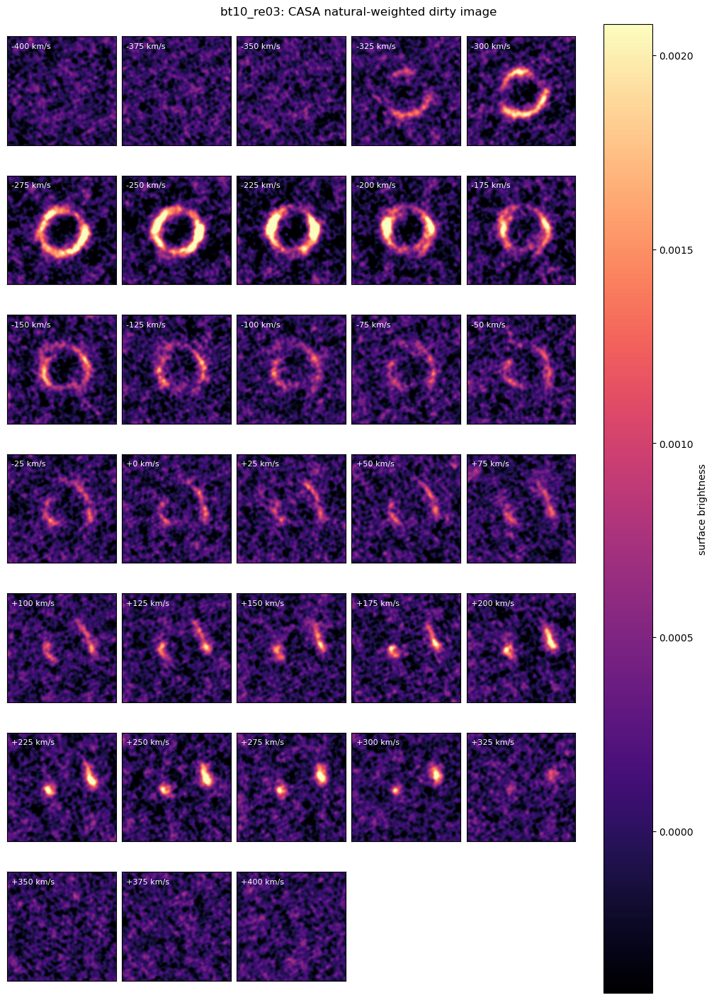

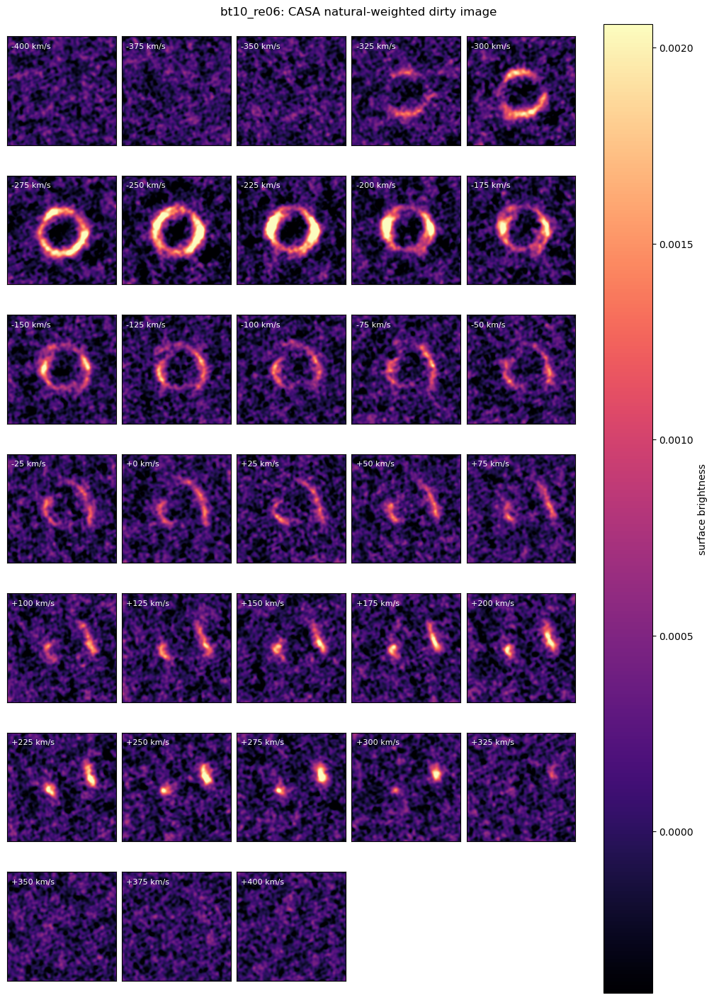

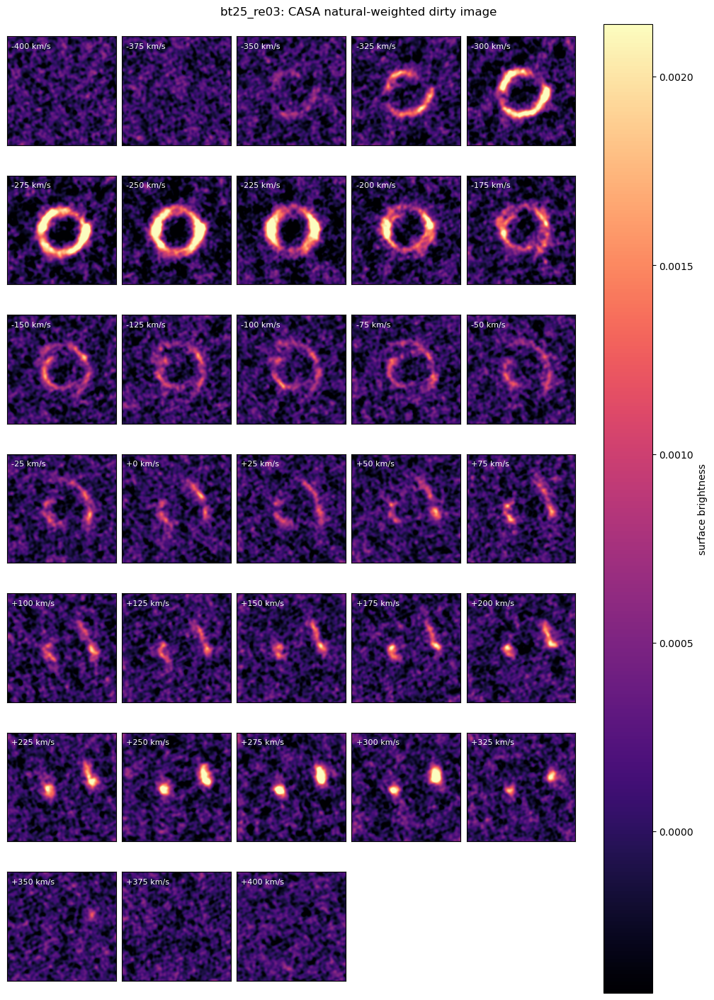

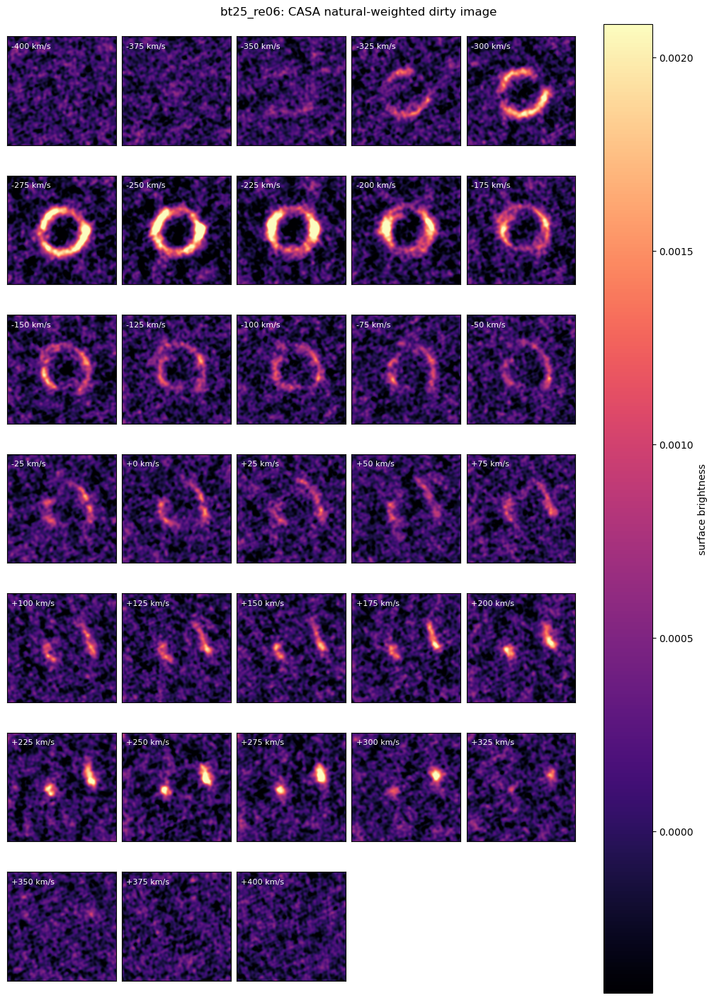

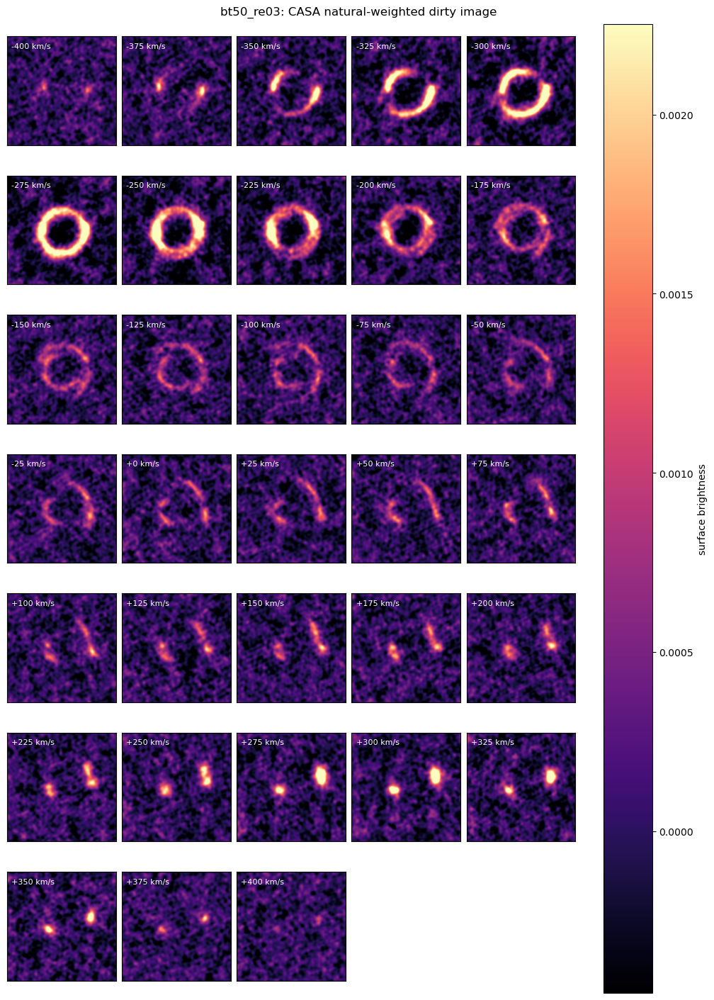

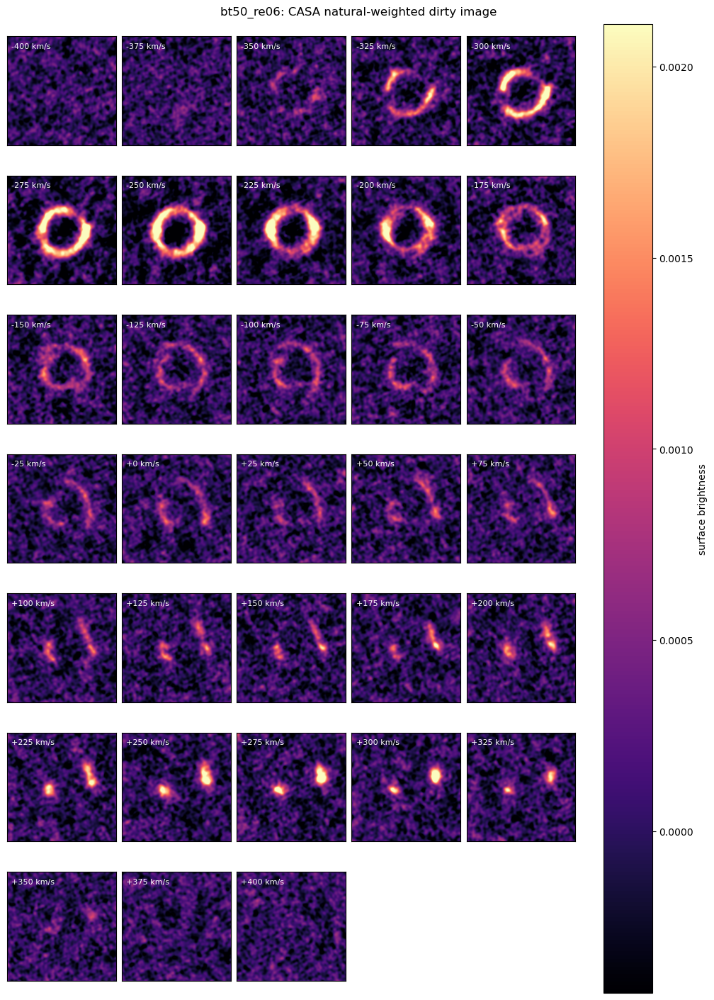

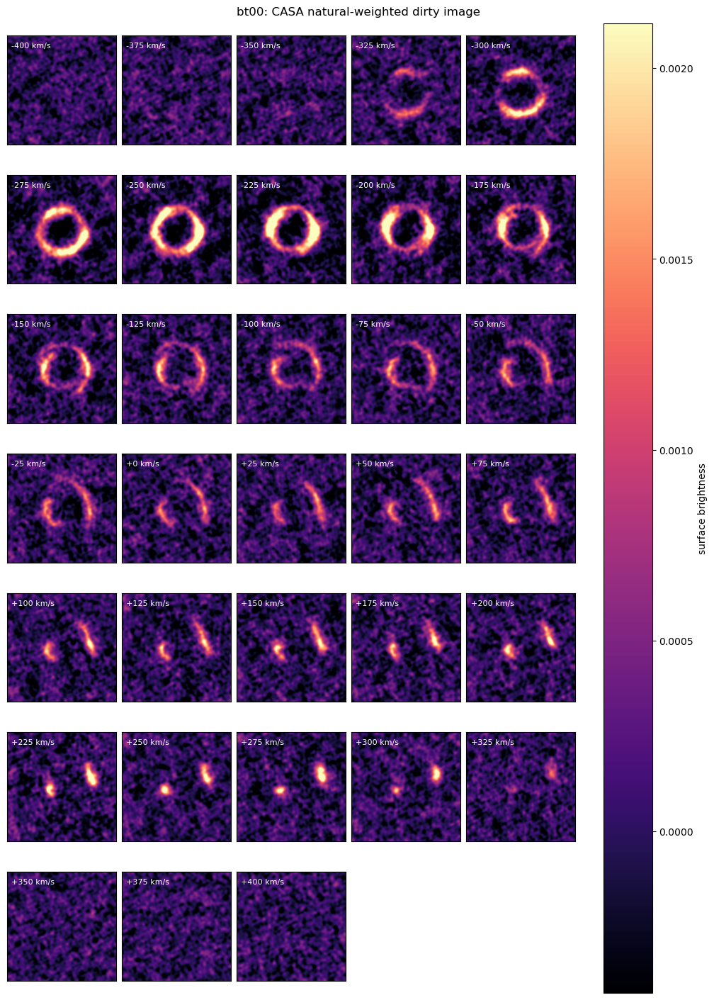

In [7]:
def plot_mock_channel_maps(cube, case_name, noise_sigma, label, ncols=5):
    nchan = cube.shape[0]
    nrows = int(np.ceil(nchan / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(2 * ncols, 2 * nrows), constrained_layout=True)
    axes = np.atleast_1d(axes).ravel()
    image = None
    for index, ax in enumerate(axes):
        if index >= nchan:
            ax.set_visible(False)
            continue
        image = ax.imshow(
            cube[index], origin='lower', cmap='magma',
            vmin=-2.0 * noise_sigma, vmax=10.0 * noise_sigma,
            extent=(axis[0], axis[-1], axis[0], axis[-1]),
        )
        ax.text(0.04, 0.94, f'{VELOCITY_CHANNELS_KMS[index]:+.0f} km/s',
                transform=ax.transAxes, ha='left', va='top', color='white', fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])
    fig.colorbar(image, ax=axes[:nchan].tolist(), label='surface brightness')
    fig.suptitle(f'{case_name}: {label}')
    plt.show()

for case in CASES:
    mock = MOCKS[case['name']]
    plot_mock_channel_maps(
        mock['data_cube'], case['name'], mock['noise_sigma'],
        label='CASA natural-weighted dirty image',
    )


## Approximate dirty-image likelihood and timing benchmark

RMSはline-free edge channelsからMADで測ります。Pixel間相関を無視するため、reduced χ²やevidenceの絶対値を厳密な統計量として解釈しません。


In [8]:
def complete_parameters(theta, case, model_name):
    # まず全parameterをtruthで固定し、TOMLでfreeにしたものだけ上書きする。
    parameters = truth_parameters(case)
    if model_name == 'no_bulge':
        parameters['bulge_to_total'] = 0.0
    parameters.update(zip(MODEL_FREE_NAMES[model_name], np.asarray(theta, dtype=float), strict=True))
    return parameters

def prior_transform(unit_cube, model_name):
    # dynestyの単位cube [0, 1]を、TOMLで指定した一様priorへ変換する。
    names = MODEL_FREE_NAMES[model_name]
    lower = np.array([BOUNDS[name]['lower'] for name in names])
    upper = np.array([BOUNDS[name]['upper'] for name in names])
    return lower + np.asarray(unit_cube) * (upper - lower)

def make_loglikelihood(case, model_name):
    mock = MOCKS[case['name']]
    data = mock['data_cube'][FIT_MASK]
    sigma = mock['noise_sigma']
    log_normalization = data.size * np.log(2.0 * np.pi * sigma**2)
    def loglikelihood(theta):
        # Dirty-image pixel相関を無視した近似Gaussian likelihood。
        model = observed_model_cube(complete_parameters(theta, case, model_name), case['name'])[FIT_MASK]
        chi2 = np.sum(((data - model) / sigma) ** 2)
        return -0.5 * (chi2 + log_normalization)
    return loglikelihood

benchmark_loglike = make_loglikelihood(CASES[0], 'bulge')
benchmark_rng = np.random.default_rng(1234)
benchmark_points = [prior_transform(benchmark_rng.random(len(MODEL_FREE_NAMES['bulge'])), 'bulge') for _ in range(30)]
start = time.perf_counter()
for point in benchmark_points:
    benchmark_loglike(point)
SECONDS_PER_LOGLIKE = (time.perf_counter() - start) / len(benchmark_points)
print(f'{1e3 * SECONDS_PER_LOGLIKE:.2f} ms per likelihood evaluation ({1/SECONDS_PER_LOGLIKE:.1f} evaluations/s, one core)')

147.02 ms per likelihood evaluation (6.8 evaluations/s, one core)


## Dynamic nested sampling

並列sampling中は、先頭のcache-miss fitだけDynesty標準のprogress barを代表として表示する。


In [9]:
def weighted_quantile(values, quantiles, weights):
    # Nested samplingの不均一なposterior weightを考慮した分位点。
    order = np.argsort(values)
    sorted_values = np.asarray(values)[order]
    cumulative = np.cumsum(np.asarray(weights)[order])
    cumulative /= cumulative[-1]
    return np.interp(quantiles, cumulative, sorted_values)

def run_nested_fit(case, model_name, task_seed, show_progress=False):
    names = MODEL_FREE_NAMES[model_name]
    loglikelihood = make_loglikelihood(case, model_name)
    start = time.perf_counter()
    # 1 fit内のproposal/likelihood評価をthread poolへ流す。
    with ThreadPoolExecutor(max_workers=DYNESTY_WORKERS_PER_FIT) as dynesty_pool:
        results = run_dynamic_dynesty(
            loglikelihood, lambda u: prior_transform(u, model_name), len(names),
            nlive_init=dynesty_cfg['nlive_init'], nlive_batch=dynesty_cfg['nlive_batch'],
            dlogz_init=dynesty_cfg['dlogz_init'], pfrac=dynesty_cfg['pfrac'],
            evidence_threshold=dynesty_cfg['evidence_threshold'],
            target_n_effective=dynesty_cfg['target_n_effective'],
            max_batches=dynesty_cfg['max_batches'],
            bound=dynesty_cfg['bound'], sample=dynesty_cfg['sample'],
            rstate=np.random.default_rng(np.random.SeedSequence([dynesty_cfg['random_seed'], task_seed])),
            pool=dynesty_pool, queue_size=DYNESTY_WORKERS_PER_FIT,
            use_pool={'prior_transform': False},
            print_progress=show_progress,
        )
    elapsed = time.perf_counter() - start
    weights = np.exp(results.logwt - results.logz[-1])
    posterior = {}
    for column, name in enumerate(names):
        posterior[name] = weighted_quantile(results.samples[:, column], [0.16, 0.50, 0.84], weights)
    best_index = int(np.argmax(results.logl))
    # 診断cubeにはposterior中央値ではなくmaximum-likelihood sampleを使う。
    return {
        'results': results, 'weights': weights, 'posterior': posterior,
        'best_parameters': complete_parameters(results.samples[best_index], case, model_name),
        'logz': float(results.logz[-1]), 'logzerr': float(results.logzerr[-1]),
        'max_logl': float(results.logl[best_index]), 'ncall': int(np.sum(results.ncall)), 'elapsed_seconds': elapsed,
    }

def run_nested_task(task):
    case, model_name, task_seed, show_progress = task
    return case['name'], model_name, run_nested_fit(case, model_name, task_seed, show_progress)

# Model/likelihoodの意味を意図的に変えた時だけ手動で上げる。
CACHE_VERSION = 4

def stable_task_seed(case_name, model_name):
    digest = hashlib.sha256(f'{case_name}:{model_name}'.encode()).digest()
    return int.from_bytes(digest[:4], byteorder='little')

def file_hash(path):
    return hashlib.sha256(Path(path).read_bytes()).hexdigest()

def sampling_metadata(case, model_name):
    """Cache判定用のTOML設定とCASA product hashを返す。"""
    product_dir = MOCKS[case['name']]['product_dir']
    work_dir = MOCKS[case['name']]['work_dir']
    observation_hashes = {
        'dirty.image.fits': file_hash(product_dir / 'dirty.image.fits'),
        'dirty.psf.fits': file_hash(product_dir / 'dirty.psf.fits'),
        'uv_data.npz': file_hash(work_dir / 'uv_data.npz'),
        'sn_normalization.json': file_hash(product_dir / 'sn_normalization.json'),
    }
    return {
        'cache_version': CACHE_VERSION,
        'truth_config': TRUTH_CONFIG,
        # Worker数は統計modelを変えないのでcache判定から除外する。
        'stage_config': {key: value for key, value in CONFIG.items() if key != 'parallel'},
        'case': case,
        'model_name': model_name,
        'observation_hashes': observation_hashes,
    }

CACHE_IGNORED_METADATA_KEYS = {
    'source_hashes', 'function_hashes', 'dependency_hashes',
    'dynesty_version', 'numpy_version',
}

def cache_relevant_metadata(metadata):
    return {key: value for key, value in metadata.items()
            if key not in CACHE_IGNORED_METADATA_KEYS}

def sampling_fingerprint(metadata):
    serialized = json.dumps(
        cache_relevant_metadata(metadata), sort_keys=True,
        default=lambda value: value.item() if isinstance(value, np.generic) else str(value),
    )
    return hashlib.sha256(serialized.encode()).hexdigest()

def flatten_metadata(value, prefix=''):
    if isinstance(value, dict):
        flattened = {}
        for key, item in value.items():
            child = f'{prefix}.{key}' if prefix else str(key)
            flattened.update(flatten_metadata(item, child))
        return flattened
    return {prefix: value}

def metadata_differences(cached, current, max_items=12):
    if cached is None:
        return ['legacy cache has no metadata']
    old = flatten_metadata(cache_relevant_metadata(cached))
    new = flatten_metadata(cache_relevant_metadata(current))
    changed = []
    for key in sorted(set(old) | set(new)):
        if old.get(key) != new.get(key):
            changed.append(
                f'{key}: {old.get(key, "<missing>")!r} -> {new.get(key, "<missing>")!r}'
            )
    if len(changed) > max_items:
        changed = changed[:max_items] + [f'... and {len(changed) - max_items} more']
    return changed or ['fingerprint format changed']

def cache_path(case_name, model_name):
    return CACHE_DIR / f'{case_name}__{model_name}.pkl'

def load_cached_result(case_name, model_name, metadata):
    path = cache_path(case_name, model_name)
    if not path.exists():
        return None
    try:
        with path.open('rb') as handle:
            payload = pickle.load(handle)
    except (OSError, EOFError, pickle.UnpicklingError):
        print(f'{case_name:10s} {model_name:9s}: unreadable cache ignored')
        return None
    cached_metadata = payload.get('metadata')
    if (cached_metadata is not None
            and sampling_fingerprint(cached_metadata) == sampling_fingerprint(metadata)):
        return payload['result']
    print(f'{case_name:10s} {model_name:9s}: stale cache ignored')
    for change in metadata_differences(payload.get('metadata'), metadata):
        print(f'    {change}')
    return None

def save_cached_result(case_name, model_name, metadata, result):
    path = cache_path(case_name, model_name)
    temporary_path = path.with_suffix('.tmp')
    payload = {
        'fingerprint': sampling_fingerprint(metadata),
        'metadata': metadata,
        'result': result,
    }
    with temporary_path.open('wb') as handle:
        pickle.dump(payload, handle, protocol=pickle.HIGHEST_PROTOCOL)
    os.replace(temporary_path, path)

RESULTS = {}
BENCHMARK_ONLY = os.getenv('STAGE3_BENCHMARK_ONLY', '0') == '1'
if not BENCHMARK_ONLY:
    max_cases = int(os.getenv('STAGE3_MAX_CASES', str(len(CASES))))
    run_models = tuple(name.strip() for name in os.getenv('STAGE3_MODELS', 'no_bulge,bulge').split(','))
    if not set(run_models) <= set(MODEL_FREE_NAMES):
        raise ValueError(f'Unknown STAGE3_MODELS value: {run_models}')
    run_cases = CASES[:max_cases]
    force_refit = os.getenv('STAGE3_FORCE_REFIT', '0') == '1'
    tasks = []
    task_metadata = {}
    # 1 taskは「1 physical case × 1 model」。Cache missだけを並列実行する。
    for case, model_name in product(run_cases, run_models):
        key = (case['name'], model_name)
        metadata = sampling_metadata(case, model_name)
        task_metadata[key] = metadata
        cached_result = None if force_refit else load_cached_result(*key, metadata)
        if cached_result is None:
            # 先頭のcache-miss fitだけDynesty標準の進捗を表示する。
            tasks.append((case, model_name, stable_task_seed(*key), len(tasks) == 0))
        else:
            RESULTS.setdefault(case['name'], {})[model_name] = cached_result
            print(f'{case["name"]:10s} {model_name:9s}: loaded valid cache')
    total_start = time.perf_counter()
    if tasks:
        available_cpus = os.cpu_count() or 1
        configured_workers = int(parallel_cfg['max_workers'])
        max_workers = min(

            configured_workers,
            max(1, available_cpus // DYNESTY_WORKERS_PER_FIT),
            len(tasks),
        )
        total_workers = max_workers * DYNESTY_WORKERS_PER_FIT
        print(
            f'running {len(tasks)} cache-miss fits: {max_workers} concurrent fits x '
            f'{DYNESTY_WORKERS_PER_FIT} Dynesty workers = {total_workers} workers'
        )
        # dynesty fitはprocess単位で並列化し、各process内の数値libraryは1 threadに制限する。
        if max_workers == 1:
            completed_tasks = map(run_nested_task, tasks)
            pool = None
        else:
            context = mp.get_context(parallel_cfg['start_method'])
            pool = context.Pool(processes=max_workers)
            completed_tasks = pool.imap_unordered(run_nested_task, tasks, chunksize=1)
        try:
            for case_name, model_name, result in completed_tasks:
                RESULTS.setdefault(case_name, {})[model_name] = result
                save_cached_result(case_name, model_name, task_metadata[(case_name, model_name)], result)

                
                print(f"{case_name:10s} {model_name:9s}: lnZ={result['logz']:.2f} +/- {result['logzerr']:.2f}, calls={result['ncall']:,}, fit time={result['elapsed_seconds']/60:.1f} min; cache saved")
        finally:
            if pool is not None:
                pool.close()
                pool.join()
    else:
        print('all requested fits loaded from valid caches; dynesty sampling skipped')
    print(f'total sampling/cache wall time = {(time.perf_counter()-total_start)/60:.2f} min')
else:
    print('Benchmark-only mode: nested sampling skipped.')

bt10_re03  no_bulge : loaded valid cache
bt10_re03  bulge    : loaded valid cache
bt10_re06  no_bulge : loaded valid cache
bt10_re06  bulge    : loaded valid cache
bt25_re03  no_bulge : loaded valid cache
bt25_re03  bulge    : loaded valid cache


bt25_re06  no_bulge : loaded valid cache
bt25_re06  bulge    : loaded valid cache


bt50_re03  no_bulge : loaded valid cache
bt50_re03  bulge    : loaded valid cache
bt50_re06  no_bulge : loaded valid cache
bt50_re06  bulge    : loaded valid cache
bt00       no_bulge : loaded valid cache


bt00       bulge    : loaded valid cache
all requested fits loaded from valid caches; dynesty sampling skipped
total sampling/cache wall time = 0.00 min


## Evidence and parameter summary

The bulge model uses a continuous prior down to `B/T = 0`. Although its model family approaches the no-bulge model at that boundary, the exact boundary has zero probability under a continuous prior. The evidence therefore remains a meaningful comparison: an unnecessary bulge is penalized through the extra prior volume (the Occam factor). The numerical Bayes factor is nevertheless prior-dependent, so the adopted upper bound and prior shape should be reported and later tested for sensitivity. A positive lower bound would answer a different question—whether a bulge larger than that imposed minimum is required.


case,B/T truth,Re truth [kpc],lnZ no bulge,lnZ bulge,Delta lnZ,Delta lnZ numerical error
str9,float64,float64,float64,float64,float64,float64
bt10_re03,0.100,0.300,5069369.019,5077377.177,8008.159,0.590
bt10_re06,0.100,0.600,5074189.085,5075654.254,1465.169,0.599
bt25_re03,0.250,0.300,5055886.507,5073564.836,17678.329,0.605
bt25_re06,0.250,0.600,5063493.376,5068383.882,4890.506,0.625
bt50_re03,0.500,0.300,5033631.124,5062584.110,28952.986,0.655
bt50_re06,0.500,0.600,5066609.877,5082497.570,15887.693,0.616
bt00,0.000,nan,5068151.786,5068136.830,-14.956,0.579


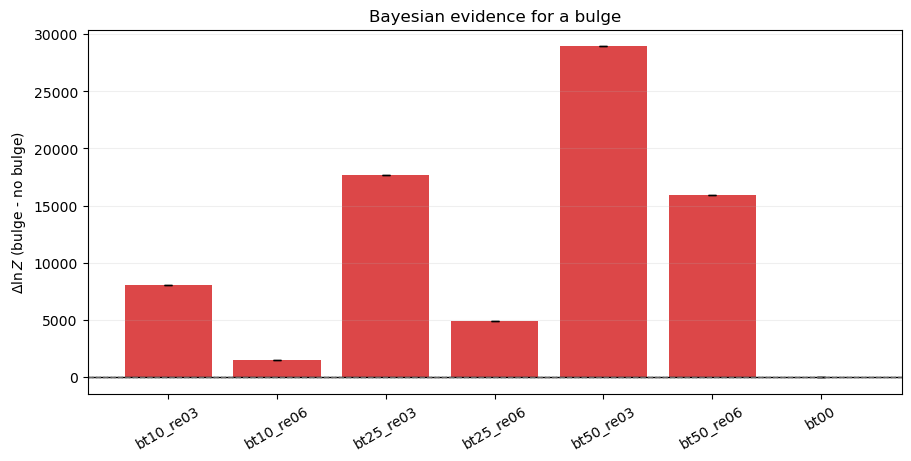

In [10]:
FULL_RESULTS = len(RESULTS) == len(CASES) and all(set(result) == {'no_bulge', 'bulge'} for result in RESULTS.values())
# 全case・両modelが揃ったときだけevidence比較と一括診断を作る。
if FULL_RESULTS:
    rows = []
    for case in CASES:
        no_bulge = RESULTS[case['name']]['no_bulge']
        bulge = RESULTS[case['name']]['bulge']
        rows.append((case['name'], case['bulge_to_total'], case['bulge_effective_radius_kpc'], no_bulge['logz'], bulge['logz'], bulge['logz'] - no_bulge['logz'], np.hypot(no_bulge['logzerr'], bulge['logzerr'])))
        # 独立なlnZ誤差を仮定し、Delta lnZの数値誤差は二乗和平方根で評価する。
    EVIDENCE_TABLE = Table(rows=rows, names=('case', 'B/T truth', 'Re truth [kpc]', 'lnZ no bulge', 'lnZ bulge', 'Delta lnZ', 'Delta lnZ numerical error'))
    for name in EVIDENCE_TABLE.colnames[1:]: EVIDENCE_TABLE[name].format = '.3f'
    display(EVIDENCE_TABLE)

    fig, ax = plt.subplots(figsize=(9, 4.5), constrained_layout=True)
    delta = np.asarray(EVIDENCE_TABLE['Delta lnZ'])
    error = np.asarray(EVIDENCE_TABLE['Delta lnZ numerical error'])
    colors = ['tab:blue' if value < 2.5 else 'tab:orange' if value < 5 else 'tab:red' for value in delta]
    ax.bar(np.arange(len(CASES)), delta, yerr=error, color=colors, alpha=0.85, capsize=3)
    ax.axhline(0, color='black', lw=1)
    ax.axhline(2.5, color='0.4', lw=1, ls='--')
    ax.axhline(5.0, color='0.4', lw=1, ls=':')
    ax.set_xticks(np.arange(len(CASES)), [case['name'] for case in CASES], rotation=30)
    ax.set_ylabel(r'$\Delta\ln Z$ (bulge - no bulge)')
    ax.set_title('Bayesian evidence for a bulge')
    ax.grid(axis='y', alpha=0.2)
    plt.show()

## Rotation curves and residual diagnostics

Solid black is the truth, red is the maximum-likelihood bulge model, and blue is the maximum-likelihood no-bulge model. Residual moment maps are summed over velocity after subtracting the corresponding convolved model cube.

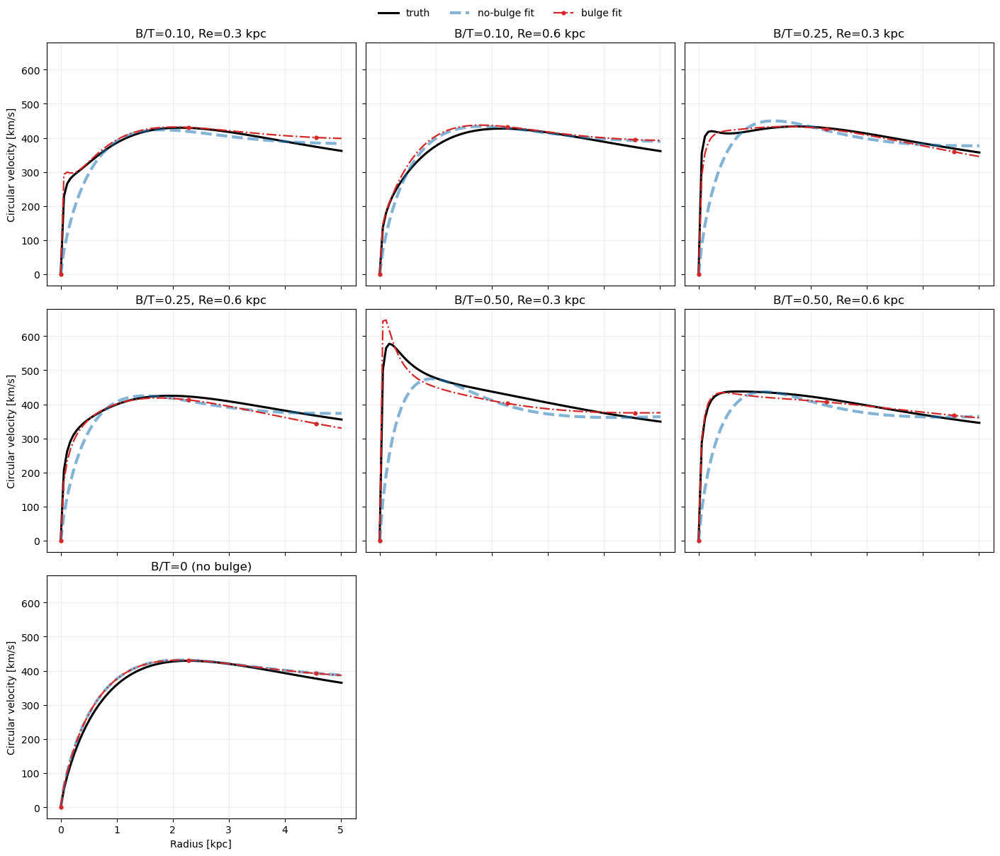

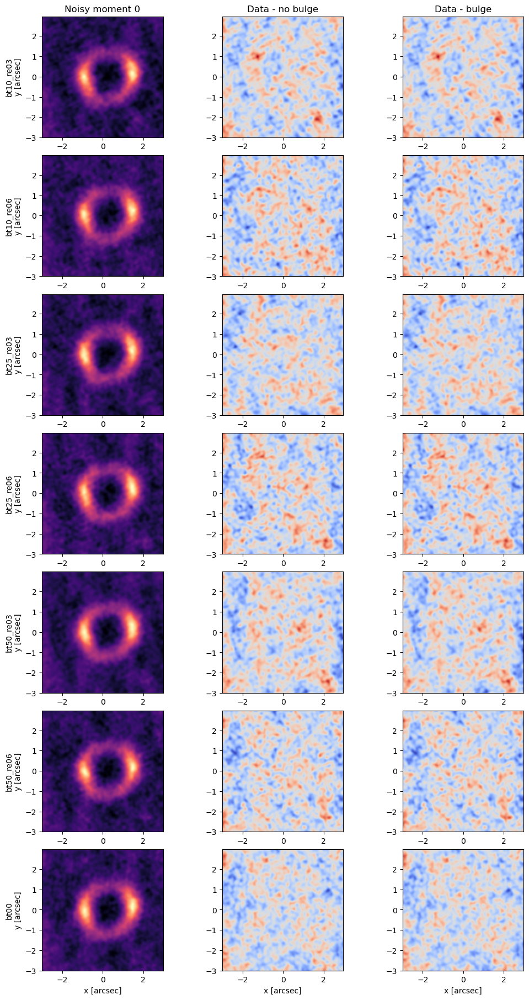

In [11]:
if FULL_RESULTS:
    ncols = 3
    nrows = int(np.ceil(len(CASES) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(14, 4 * nrows), sharex=True, sharey=True, squeeze=False, constrained_layout=True)
    for ax, case in zip(axes.flat, CASES):
        ax.plot(RADIUS_KPC, rotation_curve(case)['total_kms'], color='black', lw=2.2, label='truth')
        fit_styles = {
            'no_bulge': dict(color='tab:blue', lw=3.0, ls='--', alpha=0.55, zorder=2, label='no-bulge fit'),
            'bulge': dict(color='tab:red', lw=1.6, ls='-.', marker='o', markevery=40, ms=3.5, zorder=3, label='bulge fit'),
        }
        # Draw the broad no-bulge curve first and the marked bulge curve last so coincident fits remain visible.
        for model_name in ('no_bulge', 'bulge'):
            curve = rotation_curve(RESULTS[case['name']][model_name]['best_parameters'])
            ax.plot(RADIUS_KPC, curve['total_kms'], **fit_styles[model_name])
        title = 'B/T=0 (no bulge)' if case['bulge_to_total'] == 0 else f"B/T={case['bulge_to_total']:.2f}, Re={case['bulge_effective_radius_kpc']:.1f} kpc"
        ax.set_title(title)
        ax.grid(alpha=0.2)
    for ax in axes.flat[len(CASES):]: ax.set_visible(False)
    for ax in axes[:, 0]: ax.set_ylabel('Circular velocity [km/s]')
    for ax in axes[-1]: ax.set_xlabel('Radius [kpc]')
    handles, labels = axes.flat[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='outside upper center', ncol=3, frameon=False)
    plt.show()

    fig, axes = plt.subplots(len(CASES), 3, figsize=(10, 18), constrained_layout=True)
    extent = [axis.min(), axis.max(), axis.min(), axis.max()]
    for row, case in enumerate(CASES):
        mock = MOCKS[case['name']]
        data_moment0 = mock['data_cube'].sum(axis=0)
        residuals = {}
        for model_name in ('no_bulge', 'bulge'):
            model_cube = observed_model_cube(RESULTS[case['name']][model_name]['best_parameters'], case['name'])
            residuals[model_name] = (mock['data_cube'] - model_cube).sum(axis=0)
        limit = max(np.max(np.abs(residuals['no_bulge'])), np.max(np.abs(residuals['bulge'])))
        axes[row, 0].imshow(data_moment0, origin='lower', extent=extent, cmap='magma')
        axes[row, 1].imshow(residuals['no_bulge'], origin='lower', extent=extent, cmap='coolwarm', vmin=-limit, vmax=limit)
        axes[row, 2].imshow(residuals['bulge'], origin='lower', extent=extent, cmap='coolwarm', vmin=-limit, vmax=limit)
        axes[row, 0].set_ylabel(case['name'] + '\ny [arcsec]')
    for ax, title in zip(axes[0], ('Noisy moment 0', 'Data - no bulge', 'Data - bulge'), strict=True): ax.set_title(title)
    for ax in axes[-1]: ax.set_xlabel('x [arcsec]')
    plt.show()

## Saved fit and convergence diagnostics

For every case and model, `dynesty.plotting.runplot`, `cornerplot`, and a full-channel comparison are saved under `output/stage3/results/figures/<case>/<model>/`. Observed, model, and residual dirty images are all made directly from the corresponding visibilities with the same natural weights and NUFFT operator; they do not read CASA `tclean` images. Their colormap and color limits are shared. The source column is the best-fit intrinsic source. `fit_diagnostics.csv` reports both the Stage 3 approximate dirty-image chi-square and an independent visibility-domain chi-square.


In [12]:
if FULL_RESULTS:
    if os.getenv('STAGE3_SKIP_DYNESTY_PLOTS', '0') != '1':
        save_dynesty_diagnostic_plots()
    else:
        print('Dynesty plot regeneration skipped (STAGE3_SKIP_DYNESTY_PLOTS=1).')
    FIT_DIAGNOSTICS = save_channel_diagnostics()

Dynesty plot regeneration skipped (STAGE3_SKIP_DYNESTY_PLOTS=1).


saved output/stage3/results/figures/bt10_re03/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt10_re03/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt10_re06/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt10_re06/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re03/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re03/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re06/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt25_re06/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re03/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re03/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re06/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt50_re06/bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt00/no_bulge/all_channel_dirty_comparison.pdf


saved output/stage3/results/figures/bt00/bulge/all_channel_dirty_comparison.pdf


case,model,image_chi2,image_dof,image_reduced_chi2,visibility_chi2,visibility_dof,visibility_reduced_chi2,uv_sigma_scale,image_residual_mean_sigma,image_residual_std_sigma
str9,str8,float64,int64,float64,float64,int64,float64,float64,float64,float64
bt10_re03,no_bulge,7.4754e+05,7.2008e+05,1.0381,4.0745e+05,4.0469e+05,1.0068,0.16777,-0.036653,1.0182
bt10_re03,bulge,7.3151e+05,7.2007e+05,1.0159,4.0717e+05,4.0469e+05,1.0061,0.16777,-0.033598,1.0073
bt10_re06,no_bulge,7.5184e+05,7.2008e+05,1.0441,4.0625e+05,4.0469e+05,1.0039,0.16792,-0.015398,1.0217
bt10_re06,bulge,7.489e+05,7.2007e+05,1.04,4.0621e+05,4.0469e+05,1.0037,0.16792,-0.015381,1.0197
bt25_re03,no_bulge,7.3382e+05,7.2008e+05,1.0191,4.0857e+05,4.0469e+05,1.0096,0.16747,-0.016574,1.0093
bt25_re03,bulge,6.9848e+05,7.2007e+05,0.97001,4.0811e+05,4.0469e+05,1.0085,0.16747,-0.016195,0.98474
bt25_re06,no_bulge,7.5442e+05,7.2008e+05,1.0477,4.0356e+05,4.0469e+05,0.9972,0.16849,-0.027576,1.0232
bt25_re06,bulge,7.4466e+05,7.2007e+05,1.0341,4.0338e+05,4.0469e+05,0.99676,0.16849,-0.025906,1.0166
bt50_re03,no_bulge,7.0411e+05,7.2008e+05,0.97783,4.081e+05,4.0469e+05,1.0084,0.16735,-0.007159,0.98882


saved output/stage3/results/fit_diagnostics.csv


## Interpretation

Bulge/no-bulgeの比較にはevidence、posterior、channel residualを併用します。ただしdirty-image likelihoodは相関noiseを無視しているため、最終判断はvisibility fittingで確認します。
